<a href="https://colab.research.google.com/github/thomasjithin440/thomasjithin440/blob/main/Image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [20]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
from skimage.feature import hog
from skimage import data, exposure
import os
from pathlib import Path
from PIL import Image
import os
from PIL import Image
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import color
import matplotlib.pyplot as plt


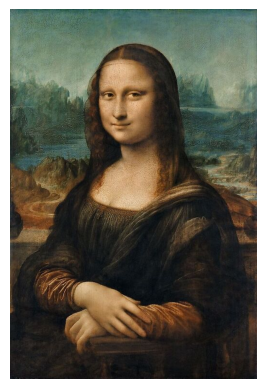

In [5]:
img = cv2.imread('mona.jpg')

# Convert to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(img)
plt.axis('off')
plt.show()

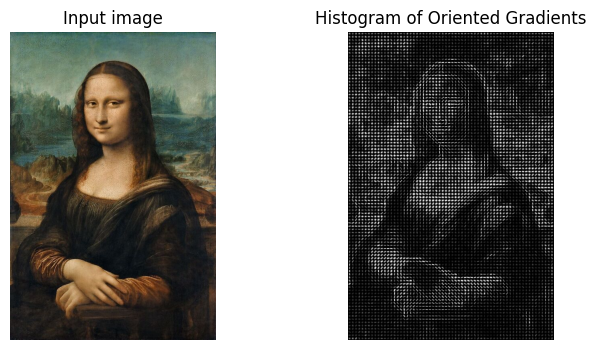

In [6]:
fd, hog_image = hog(
    img,
    orientations=8,
    pixels_per_cell=(8, 8),
    cells_per_block=(1, 1),
    visualize=True,
    channel_axis=-1,
)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis('off')
ax1.imshow(img, cmap=plt.cm.gray)
ax1.set_title('Input image')

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()

In [12]:
image_folder_path = '/content/drive/MyDrive/hog_image_recognition/input/person_car_cup'
os.chdir(image_folder_path)


In [14]:
os.listdir(image_folder_path)

['person', 'cup', 'car']

Images in folder 'person':


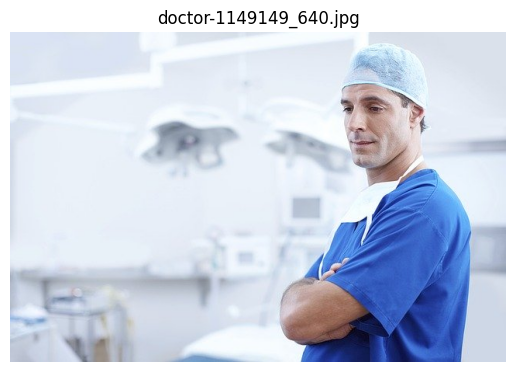

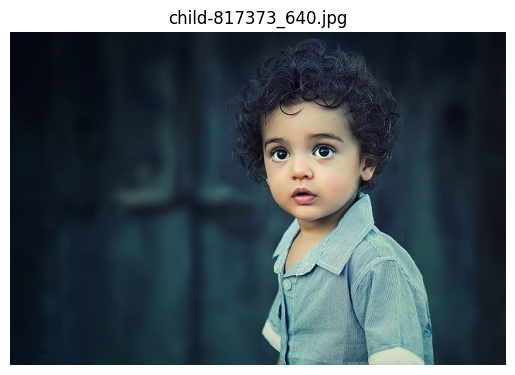

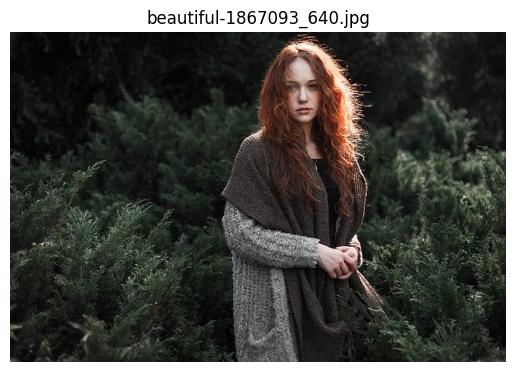

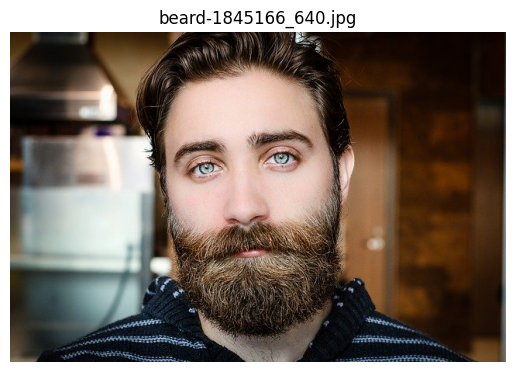

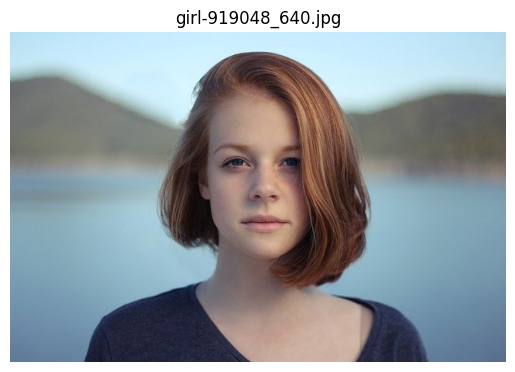

--------------------
Images in folder 'cup':


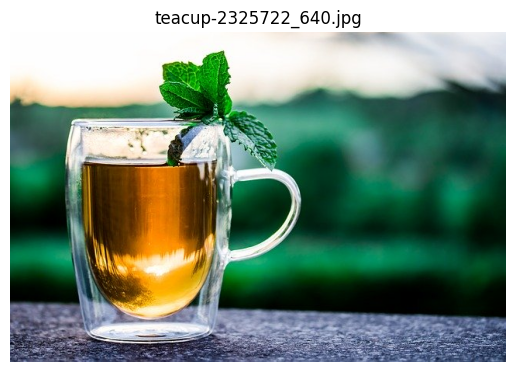

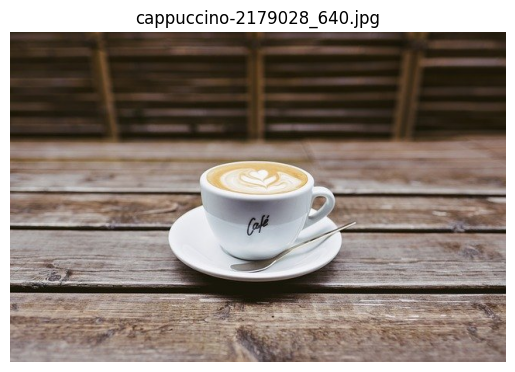

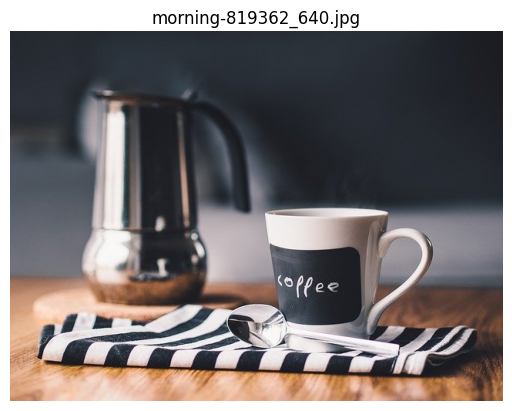

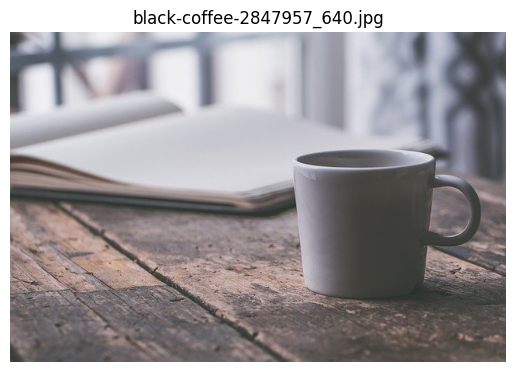

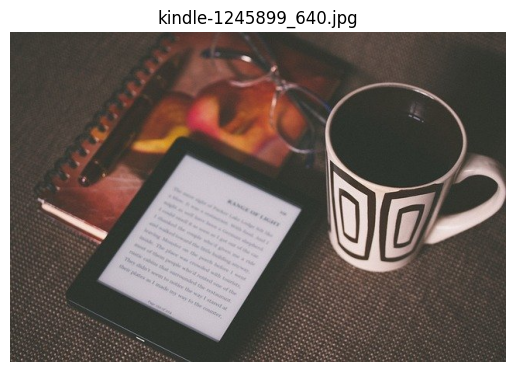

--------------------
Images in folder 'car':


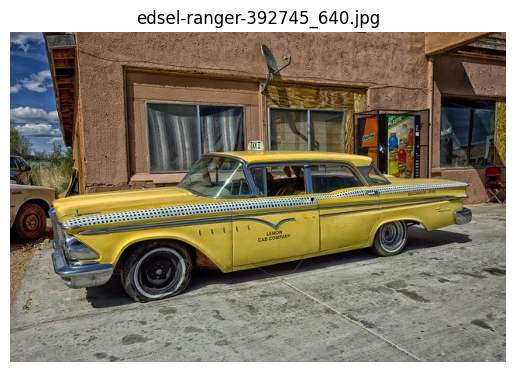

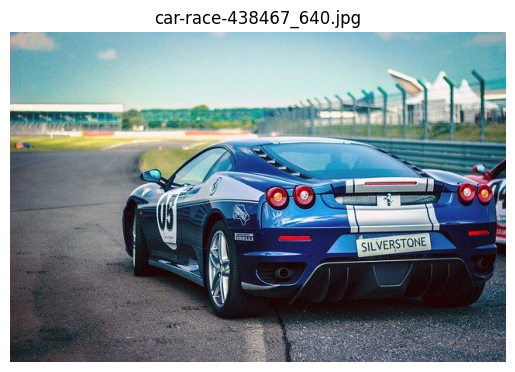

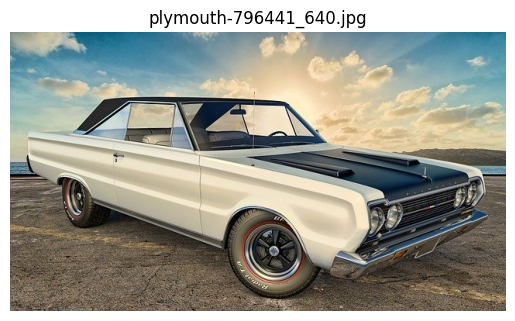

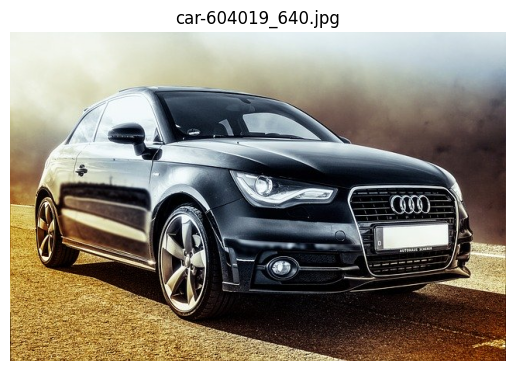

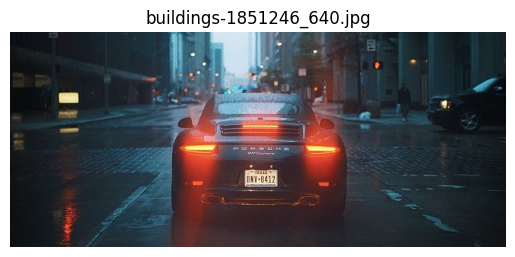

--------------------


In [18]:
folder_names = ['person', 'cup', 'car']

for folder_name in folder_names:
    folder_path = os.path.join(image_folder_path, folder_name)

    if not os.path.exists(folder_path):
        print(f"Folder '{folder_name}' not found.")
        continue

    print(f"Images in folder '{folder_name}':")

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
            image_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(image_path)
                plt.imshow(img)
                plt.axis('off')
                plt.title(filename)
                plt.show()
            except IOError:
                print(f"Error opening image: {image_path}")

    print("-" * 20)

Images in folder 'person':


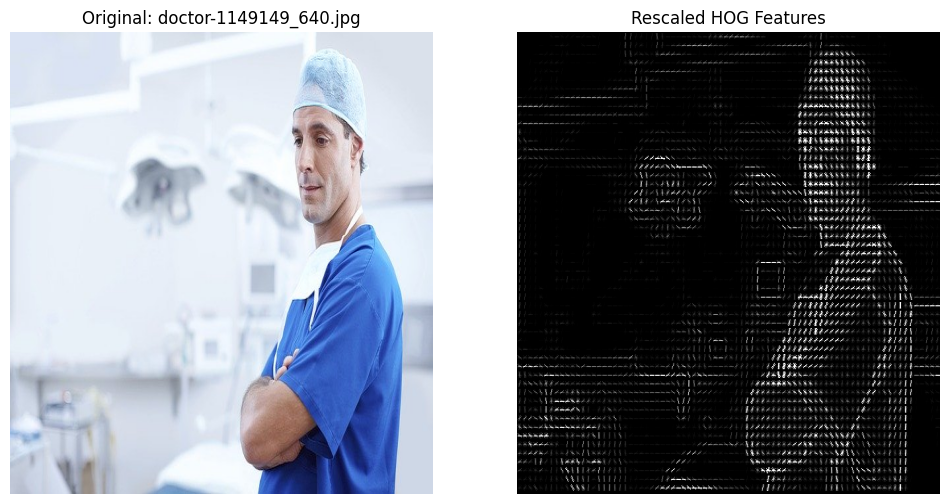

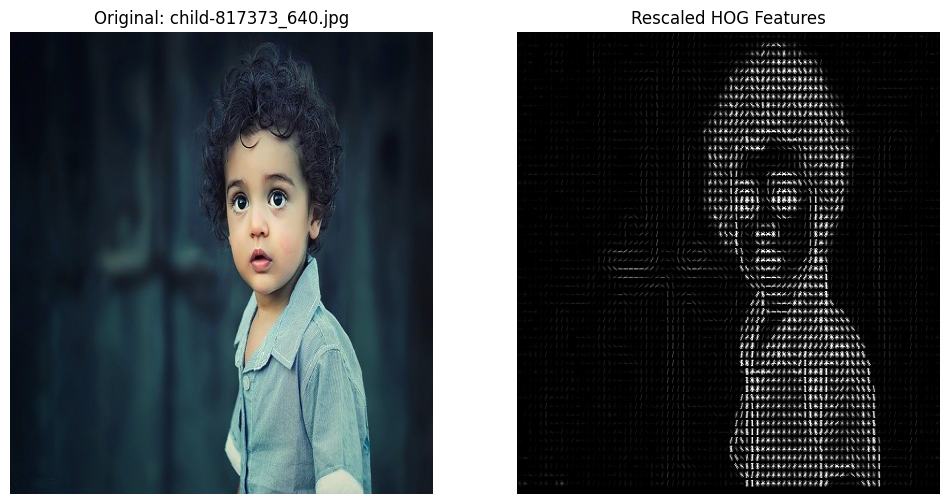

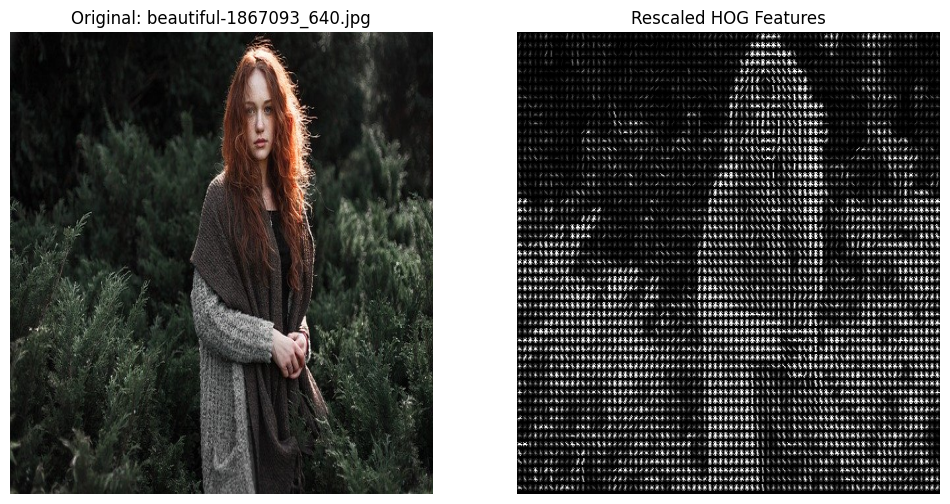

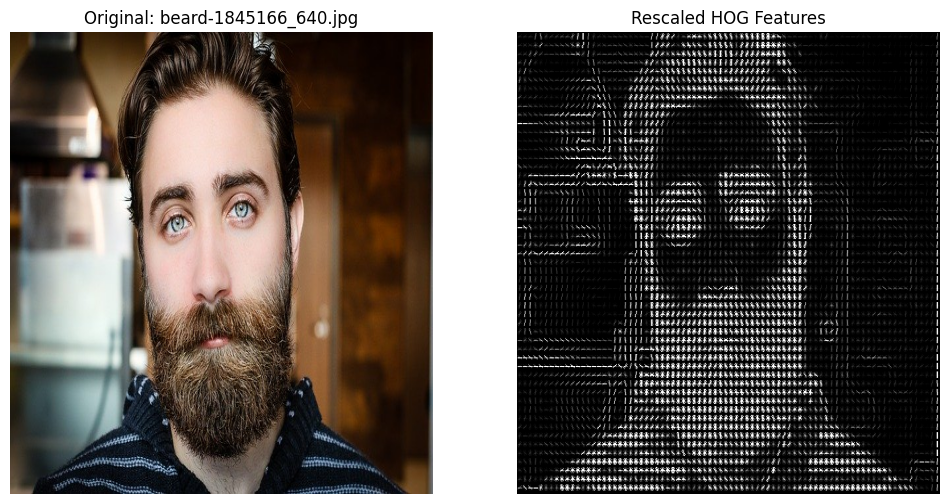

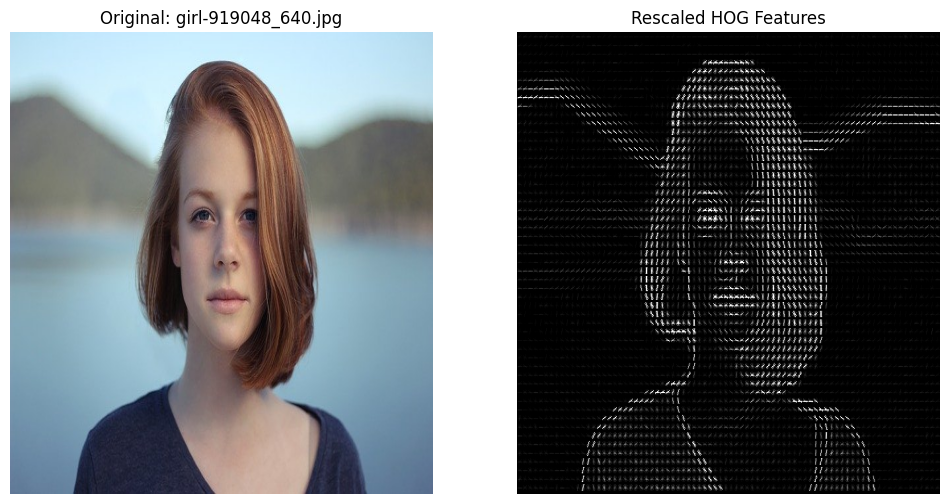

--------------------
Images in folder 'cup':


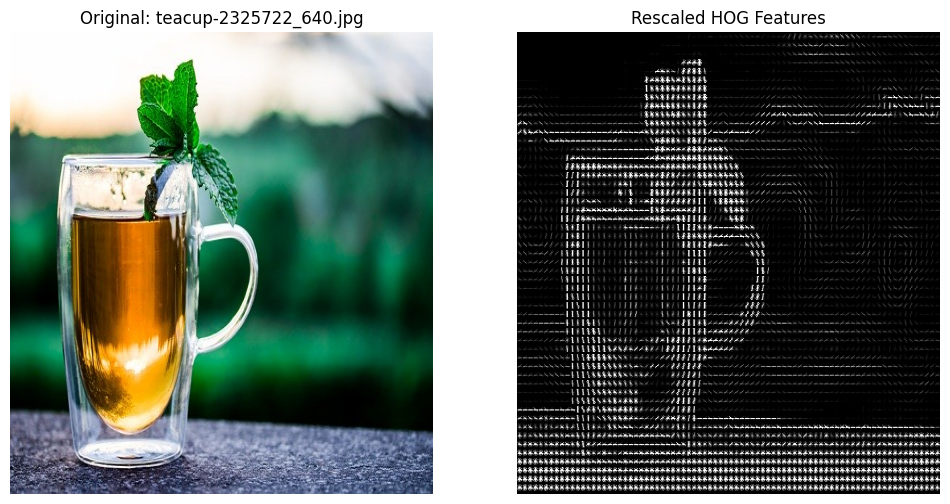

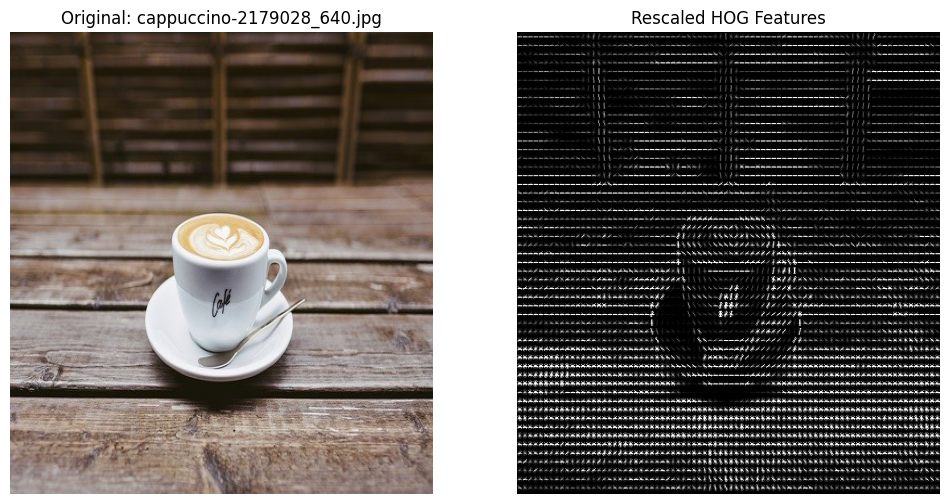

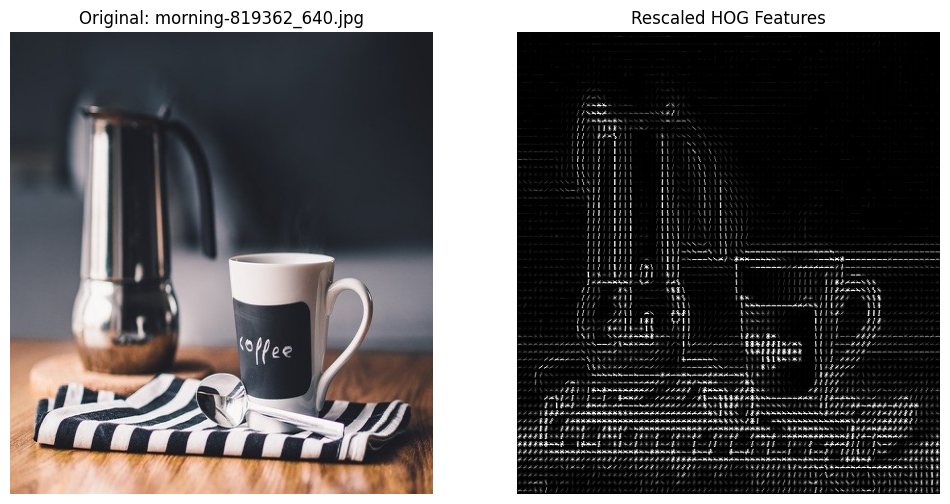

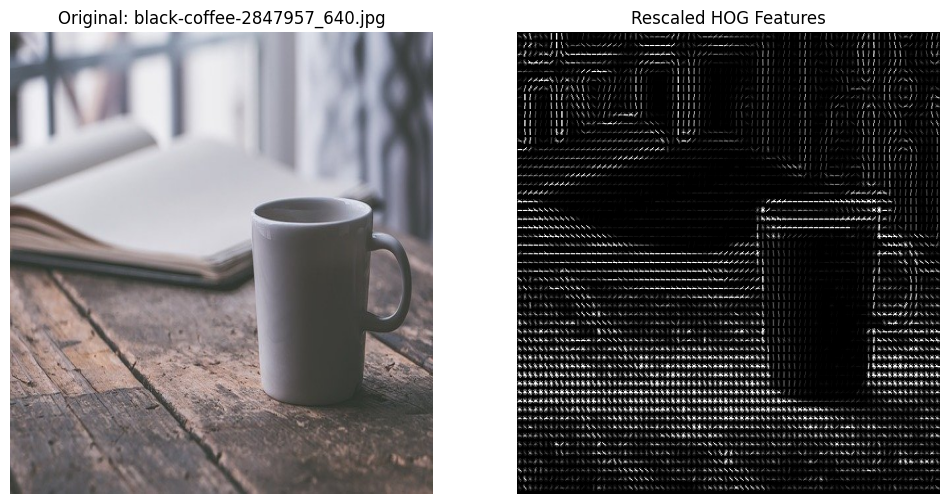

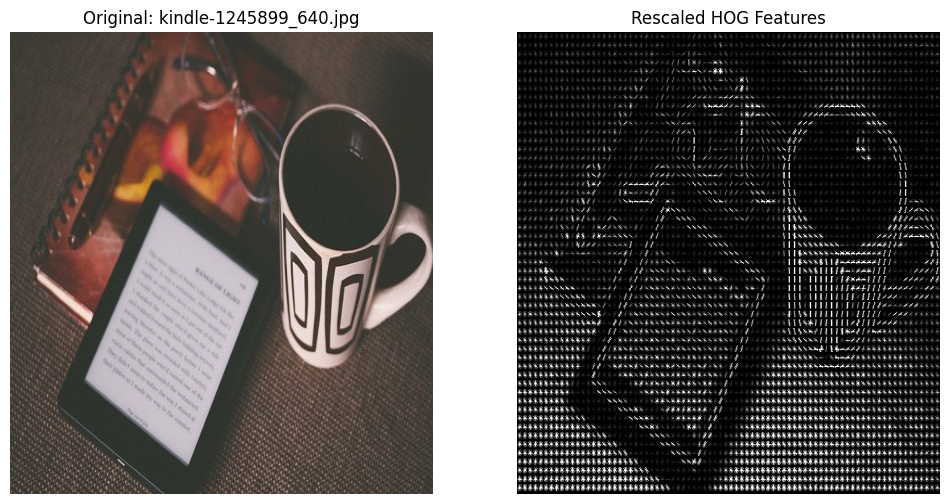

--------------------
Images in folder 'car':


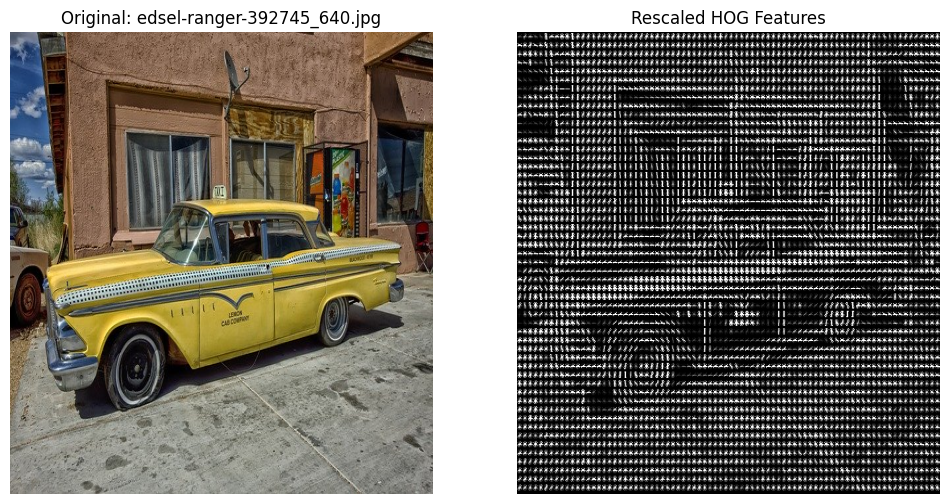

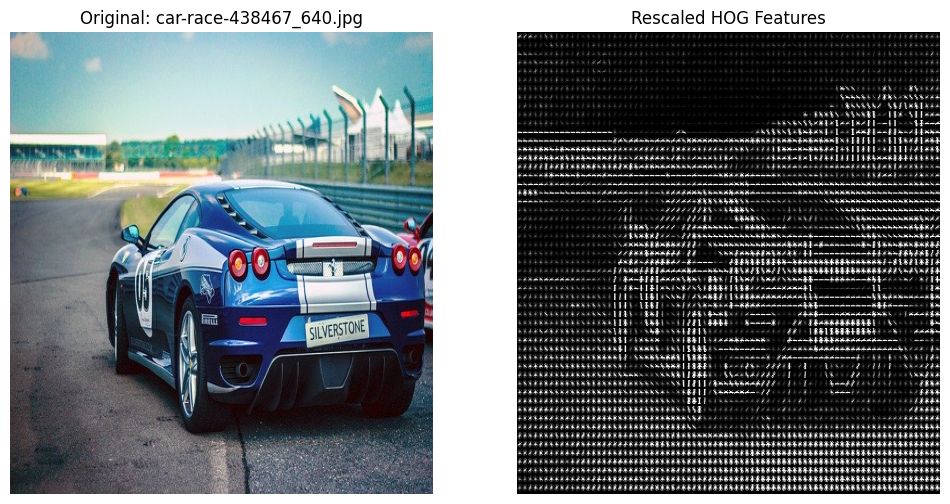

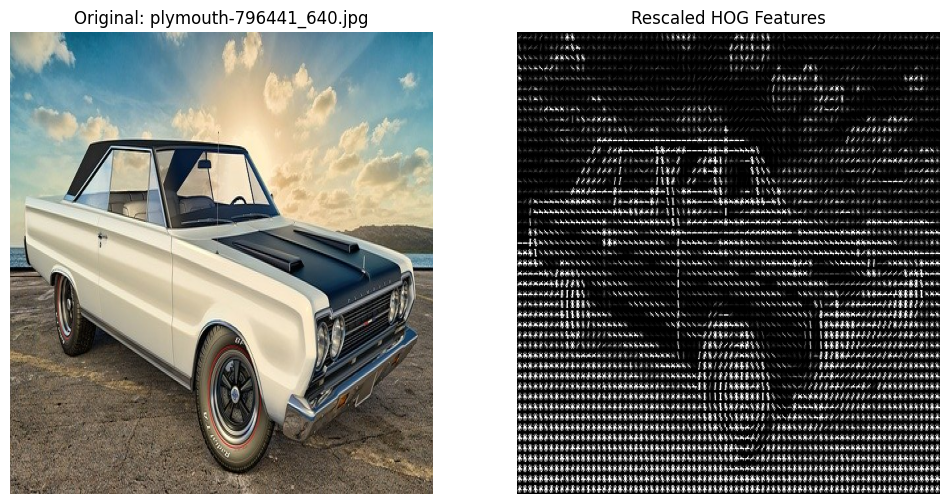

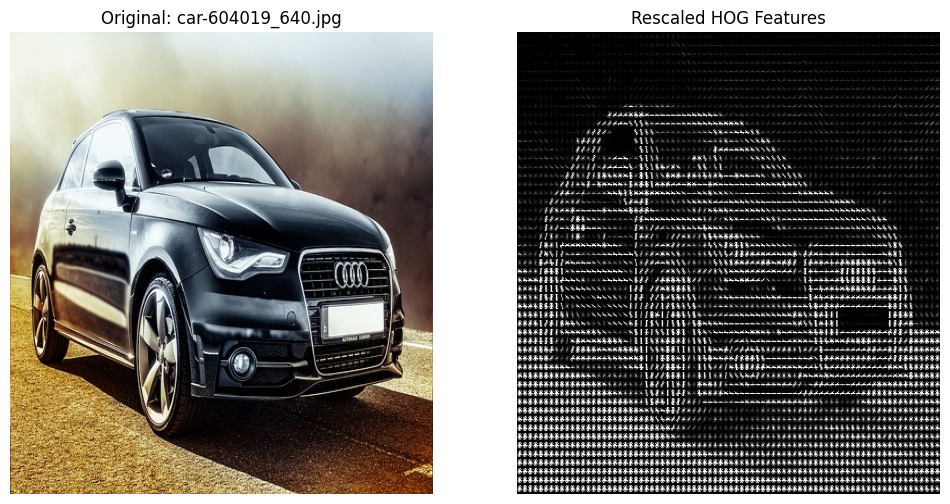

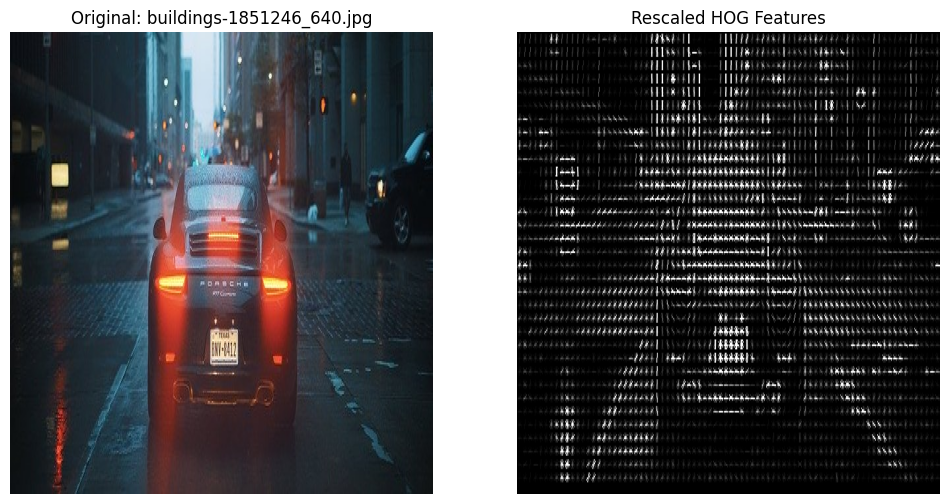

--------------------


In [26]:
folder_names = ['person', 'cup', 'car']

for folder_name in folder_names:
    folder_path = os.path.join(image_folder_path, folder_name)

    if not os.path.exists(folder_path):
        print(f"Folder '{folder_name}' not found.")
        continue

    print(f"Images in folder '{folder_name}':")

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif')):
            image_path = os.path.join(folder_path, filename)
            try:
                img = Image.open(image_path)
                img_gray = img.convert('L')

                # Compute HOG features
                features, hog_image = hog(img_gray, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)

                # Rescale HOG image for better contrast
                hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

                # Plot the original image and the HOG image
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                axes[0].imshow(img, aspect='auto')
                axes[0].axis('off')
                axes[0].set_title(f"Original: {filename}")

                axes[1].imshow(hog_image_rescaled, cmap=plt.cm.gray, aspect='auto')
                axes[1].axis('off')
                axes[1].set_title("Rescaled HOG Features")

                plt.show()
            except IOError:
                print(f"Error opening image: {image_path}")

    print("-" * 20)